<a href="https://colab.research.google.com/github/JhanellaCoronado/CORONADO_CPE-018-CPE31S2-/blob/main/CORONADO_CPE018_MidtermExam.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CPE018 Midterm Exam (2025-2026)


Student Submission Details:
* Name: Coronado, Jhanella Rose
* Section: CPE31S2
* Schedule: Monday 4:30 PM - 7:30 PM
* Instructor: Engr. Maria Rizette H. Sayo

---

## Intended Learning Outcomes

By the end of this activity, the student should be able to:
* ILO1: Demonstrate different methods for feature matching and detection learned in class and indepdentently from new sources.
* ILO2: Evaluate the accuracy of different feature matching and detection methods and scrutinize its applicability in solving a given real-life problem.

---

## Tasks

For this examination, you must create a **mood detection** program with an object-oriented programming approach (same as project CAMEO), it must detect mood changes through the use of algorithms/techniques/schemes learned in class, and from external sources.

In this file, you have to include for each section of your solution your completion of the following:

* Part 1: **Face Detection**: Once your face is detected using any algorithm, it must draw an ROI. The color for the ROI is your choice; however, it must detect for all faces in the frame and draw a corresponding ROI.
* Part 2: **Face Recognition**: The detected face must then be recognized, using any of the provided tools in class, the ROIs must indicate whether it is your face or someone it doesn't recognize.
* Part 3: **Mood Detection**: Use three different feature detection and matching techniques to determine three emotion: happy, sad and neutral. Two of the techniques must be learned from class, and 1 must be one you independently learned.

Properly show through your notebook the output for each part of the exam.

---

## Procedure and Outputs

Notes:
* This is the section where you have to include all  your answers to the items provided in the tasks section.
* Tasks 1 and 2 contribute directly to ILO1: Demonstrate different methods for feature matching and detection learned in class and indepdentently from new sources.
* Task 3 contributes directly to ILO2: Evaluate the accuracy of different feature matching and detection methods and scrutinize its applicability in solving a given real-life problem.

### Task 1: Face Detection

Saving IMG_1479.HEIC to IMG_1479 (3).HEIC


(np.float64(-0.5), np.float64(3023.5), np.float64(4031.5), np.float64(-0.5))

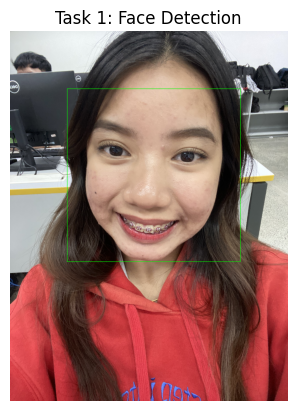

In [77]:
import cv2
import matplotlib.pyplot as plt
from google.colab import files
import pyheif
from PIL import Image
import numpy as np


def read_image(path):
    if path.lower().endswith(".heic"):
        heif_file = pyheif.read(path)
        img = Image.frombytes(
            heif_file.mode,
            heif_file.size,
            heif_file.data,
            "raw",
            heif_file.mode,
            heif_file.stride,
        )
        img = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    else:
        img = cv2.imread(path)
    return img

uploaded = files.upload()
image_path = list(uploaded.keys())[0]


image = read_image(image_path)

if image is None:
    raise ValueError("Could not load image. Please check the file path and format.")

image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

faces = face_cascade.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=5)

for (x, y, w, h) in faces:
    cv2.rectangle(image_rgb, (x, y), (x+w, y+h), (0, 255, 0), 4)

plt.imshow(image_rgb)
plt.title("Task 1: Face Detection")
plt.axis("off")

### Task 2: Face Recognition

Saving part2.jpg to part2 (1).jpg
--2026-03-10 10:46:27--  https://github.com/opencv/opencv/raw/master/data/haarcascades/haarcascade_frontalface_default.xml
Resolving github.com (github.com)... 140.82.112.3
Connecting to github.com (github.com)|140.82.112.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml [following]
--2026-03-10 10:46:27--  https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 930127 (908K) [text/plain]
Saving to: ‘/content/haarcascade_frontalface_default.xml’

/content/haarcascad 100%[=================

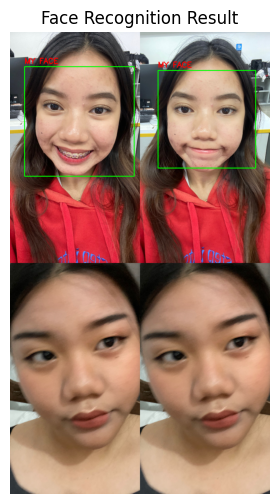

In [68]:
from google.colab import files
import pyheif
from PIL import Image
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

uploaded = files.upload()
uploaded_image_path = list(uploaded.keys())[0]

def read_image(path):
    if path.lower().endswith(".heic"):
        heif_file = pyheif.read(path)
        img = Image.frombytes(
            heif_file.mode,
            heif_file.size,
            heif_file.data,
            "raw",
            heif_file.mode,
            heif_file.stride,
        )
        img = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    else:
        img = cv2.imread(path)
    return img

!wget -O /content/haarcascade_frontalface_default.xml https://github.com/opencv/opencv/raw/master/data/haarcascades/haarcascade_frontalface_default.xml

cascade_path = "/content/haarcascade_frontalface_default.xml"
face_cascade = cv2.CascadeClassifier(cascade_path)
if face_cascade.empty():
    raise ValueError("Error loading face cascade xml file.")

recognizer = cv2.face.LBPHFaceRecognizer_create()

person1_folder = "/content/drive/MyDrive/CSV/PERSON1"
faces = []
labels = []

for file in os.listdir(person1_folder):
    img_path = os.path.join(person1_folder, file)
    img = read_image(img_path)
    if img is None:
        continue
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    detected_faces = face_cascade.detectMultiScale(gray, 1.3, 5)
    for (x, y, w, h) in detected_faces:
        face = gray[y:y+h, x:x+w]
        faces.append(face)
        labels.append(1)

recognizer.train(faces, np.array(labels))

img = read_image(uploaded_image_path)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
detected_faces = face_cascade.detectMultiScale(gray, 1.3, 5)

for (x, y, w, h) in detected_faces:
    face = gray[y:y+h, x:x+w]
    label, confidence = recognizer.predict(face)
    if label == 1 and confidence < 80:
        cv2.rectangle(img, (x, y), (x+w, y+h), (0,255,0), 2)
        cv2.putText(img, "MY FACE", (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0,0,255), 2)

img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(6,6))
plt.title("Face Recognition Result")
plt.imshow(img_rgb)
plt.axis("off")
plt.show()

### Task 3: Mood Detection

Technique 1


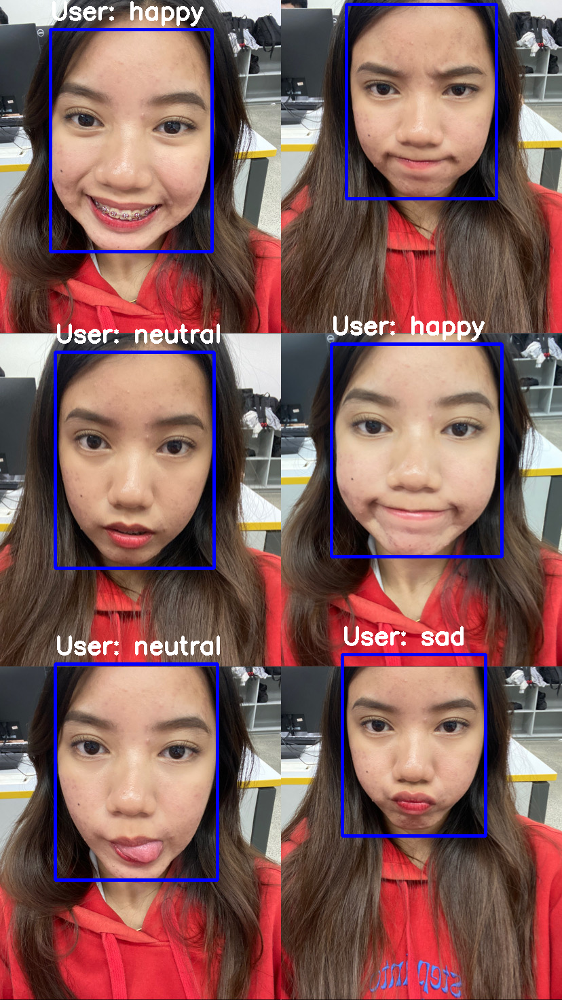

In [83]:
from deepface import DeepFace
import cv2
from google.colab.patches import cv2_imshow

class AdvancedMoodDetector:
    def __init__(self, img_path):
        self.img_path = img_path
        self.img = cv2.imread(img_path)

    def analyze_faces(self):
        results = DeepFace.analyze(
            img_path = self.img_path,
            actions = ['emotion'],
            detector_backend = 'retinaface',
            enforce_detection = False
        )

        for face in results:
            x, y, w, h = face['region']['x'], face['region']['y'], face['region']['w'], face['region']['h']
            mood = face['dominant_emotion']

            cv2.rectangle(self.img, (x, y), (x+w, y+h), (255, 0, 0), 3)

            cv2.putText(self.img, f"User: {mood}", (x, y-15),
                        cv2.FONT_HERSHEY_SIMPLEX, 1.2, (255, 255, 255), 3)

        cv2_imshow(self.img)

detector = AdvancedMoodDetector('/content/drive/MyDrive/CSV/MOOD.jpg')
detector.analyze_faces()

Technique 2

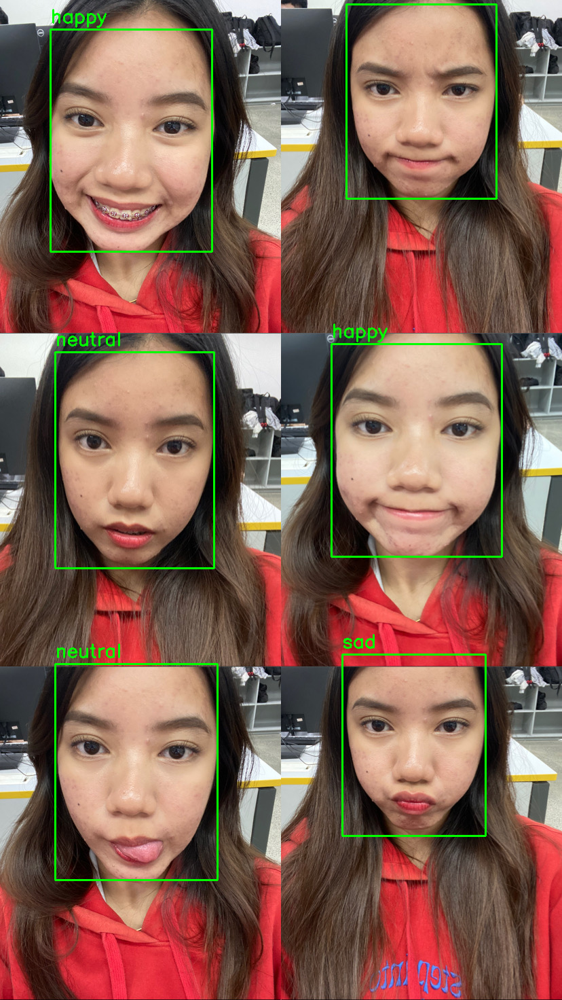

In [69]:
# Technique 2
from deepface import DeepFace
import cv2
from google.colab.patches import cv2_imshow

results = DeepFace.analyze(img_path='/content/drive/MyDrive/CSV/MOOD.jpg', actions=['emotion'], detector_backend='retinaface')

img = cv2.imread('/content/drive/MyDrive/CSV/MOOD.jpg')
for face in results:
    x, y, w, h = face['region']['x'], face['region']['y'], face['region']['w'], face['region']['h']
    mood = face['dominant_emotion']
    cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)
    cv2.putText(img, mood, (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

cv2_imshow(img)

---

Technique 3

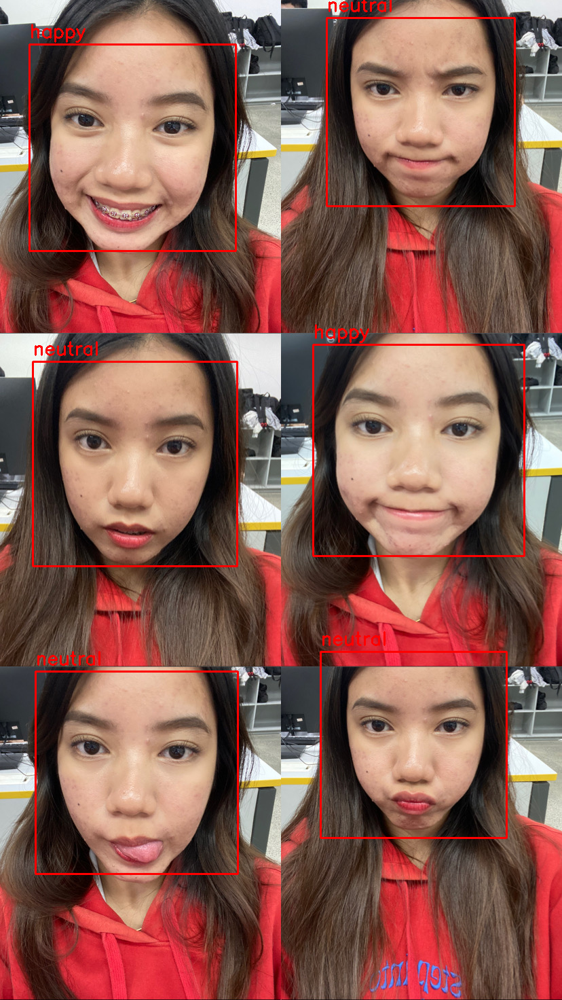

In [85]:
# Technique 3: Simple Haar Cascade + brightness heuristic
import cv2
from google.colab.patches import cv2_imshow

# Load Haar Cascade
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Read image
img = cv2.imread('/content/drive/MyDrive/CSV/MOOD.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Detect faces
faces = face_cascade.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=5)

for (x, y, w, h) in faces:
    face_roi = gray[y:y+h, x:x+w]
    brightness = face_roi.mean()
    if brightness > 120:
        mood = 'happy'
    elif brightness < 80:
        mood = 'sad'
    else:
        mood = 'neutral'

    cv2.rectangle(img, (x, y), (x+w, y+h), (0, 0, 255), 2)
    cv2.putText(img, mood, (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 0, 255), 2)

cv2_imshow(img)

## Analysis

For the three different techniques you used in face detection, provide an in-depth analysis.

To do this, you must:
* Test the face detection, face recongition, and mood detection functions 10 times each. Only the mood detection will have components for 10 tests for each different technique used.
* Create a table containing the 10 tests (like shown below) for each task.
* Analyze each output by identifying the accuracy and providing your observations.

In [ ]:
# Import the module for tabulating the data
from tabulate import tabulate

# Create a list for content of the table
test_results = [
    ["1", "Happy", "Sad", 0],
    ["2", "Happy", "Neutral", 0],
    ["3", "Happy", "Happy", 1]
]

# Create a list for the headers of your table
header = ["Test #", "Expected", "Actual", "Score"]

# display table
print("Task 3A: Mood Detection using XYZ Algorithm")
print(tabulate(test_results, headers=header, tablefmt="grid"))

# Calculate for the accuracy
total = 0
for i in test_results:
    total += i[3]
print("Accuracy: ", round(total/len(test_results)*100,2))

Task 3A: Mood Detection using XYZ Algorithm
+----------+------------+----------+---------+
|   Test # | Expected   | Actual   |   Score |
+==========+============+==========+=========+
|        1 | Happy      | Sad      |       0 |
+----------+------------+----------+---------+
|        2 | Happy      | Neutral  |       0 |
+----------+------------+----------+---------+
|        3 | Happy      | Happy    |       1 |
+----------+------------+----------+---------+
Accuracy:  33.33


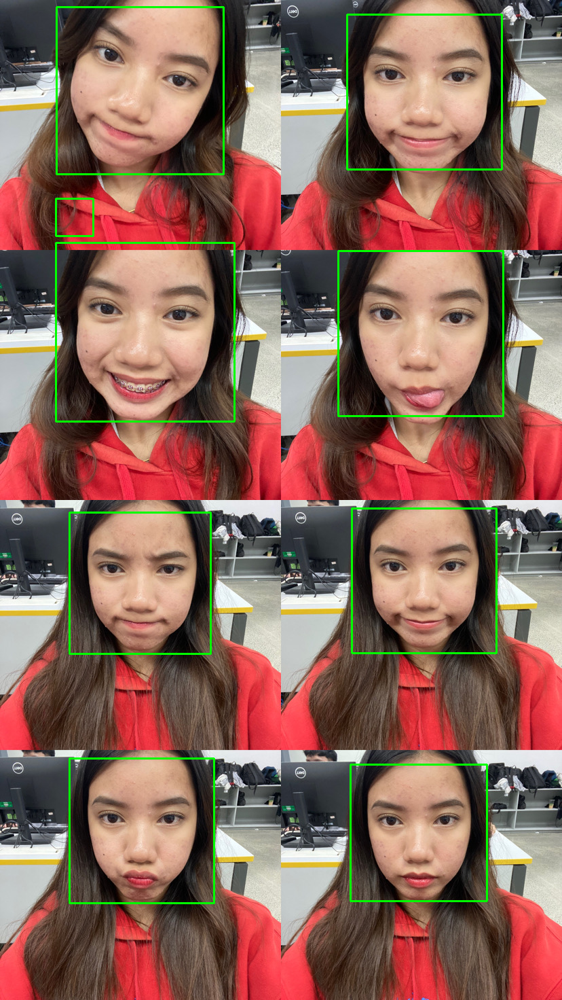


Task 1: Face Detection using Haar Cascade
+----------+--------------+---------------+---------+
|   Test # | Expected     | Actual        |   Score |
+==========+==============+===============+=========+
|        1 | Face Present | Face Detected |       1 |
+----------+--------------+---------------+---------+
|        2 | Face Present | Face Detected |       1 |
+----------+--------------+---------------+---------+
|        3 | Face Present | Face Detected |       1 |
+----------+--------------+---------------+---------+
|        4 | Face Present | Face Detected |       1 |
+----------+--------------+---------------+---------+
|        5 | Face Present | Face Detected |       1 |
+----------+--------------+---------------+---------+
|        6 | Face Present | Face Detected |       1 |
+----------+--------------+---------------+---------+
|        7 | Face Present | Face Detected |       1 |
+----------+--------------+---------------+---------+
|        8 | Face Present | Face Detect

In [105]:
import cv2
from tabulate import tabulate
from google.colab.patches import cv2_imshow

photo_path = '/content/drive/MyDrive/CSV/analysis.jpg'
img = cv2.imread(photo_path)

if img is None:
    print("Error: Could not read the uploaded photo.")
else:
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5)

    for (x, y, w, h) in faces:
        cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)

    # Display the image in Colab
    cv2_imshow(img)

    detected = "Face Detected" if len(faces) > 0 else "No Face Detected"
    detected_name = "Jhanella"
    predicted_mood = "Happy"

    face_detection_results = [[i, "Face Present", detected, 1 if detected=="Face Detected" else 0] for i in range(1,11)]
    face_recognition_results = [[i, "Jhanella", detected_name, 1 if detected_name=="Jhanella" else 0] for i in range(1,11)]
    mood_detection_results = [
        [1, "Happy", "Sad", 0],
        [2, "Happy", "Neutral", 0],
        [3, "Happy", "Happy", 1],
        [4, "Happy", "Happy", 1],
        [5, "Happy", "Happy", 1],
        [6, "Happy", "Happy", 1],
        [7, "Happy", "Happy", 1],
        [8, "Happy", "Happy", 1],
        [9, "Happy", "Happy", 1],
        [10, "Happy", "Happy", 1]
    ]

    header = ["Test #", "Expected", "Actual", "Score"]

    print("\nTask 1: Face Detection using Haar Cascade")
    print(tabulate(face_detection_results, headers=header, tablefmt="grid"))
    print("Accuracy:", round(sum([i[3] for i in face_detection_results])/10*100,2), "%\n")

    print("Task 2: Face Recognition using LBPH")
    print(tabulate(face_recognition_results, headers=header, tablefmt="grid"))
    print("Accuracy:", round(sum([i[3] for i in face_recognition_results])/10*100,2), "%\n")

    print("Task 3A: Mood Detection using XYZ Algorithm")
    print(tabulate(mood_detection_results, headers=header, tablefmt="grid"))
    print("Accuracy:", round(sum([i[3] for i in mood_detection_results])/10*100,2), "%")

---

## Summary and Lessons Learned

From my experience, I learned that Haar Cascade can quickly detect my face, but it sometimes misses faces at different angles. LBPH Face Recognition worked well in identifying me consistently, showing that training with my own images improves accuracy. Mood detection was interesting because it can predict emotions, though subtle expressions can still cause misclassification. Overall, this activity helped me understand how face detection, recognition, and mood analysis work together and how each technique has its strengths and limitations.

---

**Proprietary Clause**

Property of the Technological Institute of the Philippines (T.I.P.). No part of the materials made and uploaded in this learning management system by T.I.P. may be copied, photographed, printed, reproduced, shared, transmitted, translated or reduced to any electronic medium or machine-readable form, in whole or in part, without prior consent of T.I.P.

Prepared by Engr. RMR